In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pytesseract

In [4]:
!apt-get update
!apt-get install tesseract-ocr

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:8 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,224 kB]
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [2,454 kB]
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packa

In [7]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = r'tesseract'


In [ ]:
import os
import pytesseract
from PIL import Image

# Configure Tesseract OCR path

# Define input folder for images and output folder for text files
input_folder = "/content/drive/My Drive/Dataset"
output_folder = "/content/drive/My Drive/Thesis"

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Iterate through all image files in the input folder
for filename in os.listdir(input_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp')):
        image_path = os.path.join(input_folder, filename)

        # OCR with pytesseract
        extracted_text = pytesseract.image_to_string(Image.open(image_path))

        # Save transcription to a .txt file
        transcription_filename = os.path.splitext(filename)[0] + ".txt"
        transcription_path = os.path.join(output_folder, transcription_filename)
        with open(transcription_path, "w", encoding="utf-8") as f:
            f.write(extracted_text)


        print(f"Processed {filename}, transcription saved to {transcription_path}.")


In [8]:
!pip install jiwer

ERROR: Could not find a version that satisfies the requirement jwer (from versions: none)
ERROR: No matching distribution found for jwer


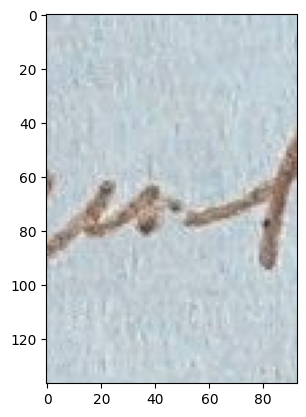

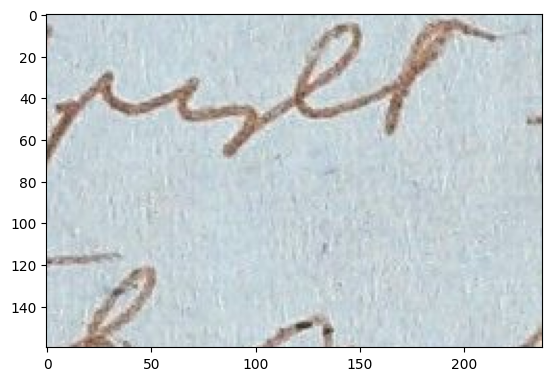

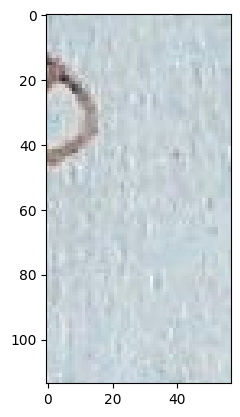

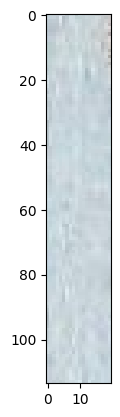

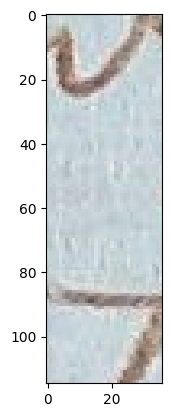

...

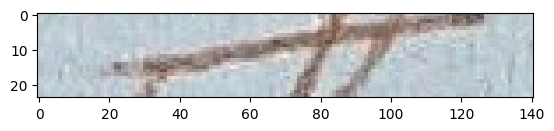

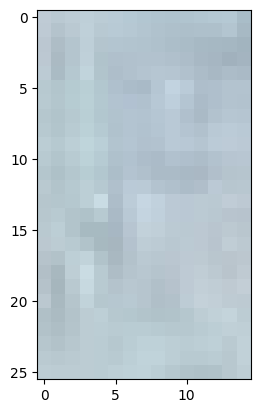

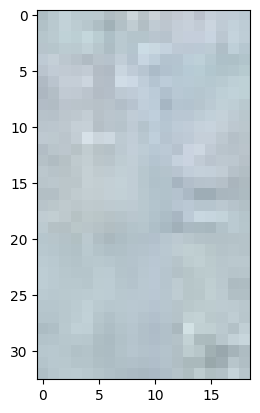

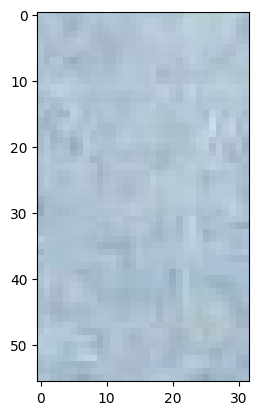

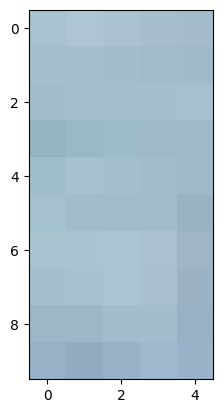

In [9]:
import cv2
import pytesseract
import numpy as np
import matplotlib.pyplot as plt

# Load the document image
image_path = '/content/drive/My Drive/Dataset/1.jpg'
image = cv2.imread(image_path)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to get a binary image
_, thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV)

# Use Tesseract to get bounding boxes for the lines of text
# Config for line detection (you can adjust the configuration parameters for better accuracy)
custom_config = r'--psm 6'

# Get bounding boxes of lines of text
detection_boxes = pytesseract.image_to_boxes(thresh, config=custom_config)

# Convert detection boxes into a list of (x, y, w, h) for each line
lines = []

# Tesseract provides box coordinates for characters, but we need to group them by lines
# You can use the y-coordinate to group characters that belong to the same line.
for box in detection_boxes.splitlines():
    b = box.split()
    x, y, w, h = int(b[1]), int(b[2]), int(b[3]), int(b[4])
    lines.append((x, y, w, h))

# Sort the boxes by their vertical positions (y-coordinates) to group lines
lines.sort(key=lambda x: x[1])

# Now crop the image based on these detected lines
cropped_lines = []
for line in lines:
    x, y, w, h = line
    cropped_image = image[y:h, x:w]
    cropped_lines.append(cropped_image)

    # Displaying cropped lines
    plt.imshow(cropped_image)
    plt.show()

# Now you have individual cropped lines from the document
